# Selección de cripto activos para una cartera de inversión

![picture](https://drive.google.com/uc?export=view&id=1ihM3JEKP-XPaoX9b5bwymu_IF4ntTlz-)

# Trabajo Práctico 1 -  Análisis y Visualización

## Introducción

En el mundo de las finanzas tradicionales, el rendimiento de los activos puede variar bajo diferentes condiciones de mercado, es entonces cuando entra en juego la diversificación. La finalidad de la exposición a diferentes clases de activos es equilibrar el riesgo y el rendimiento de una cartera.

Cuando hablamos de cripto activos, la diversificación también es una de las formas de gestionar la exposición al riesgo. Sin embargo, la alta correlación entre algunos activos y su volatilidad, dificulta la selección de una cartera equilibrada. A pesar de ello, con un portafolio cuidadosamente seleccionado de monedas alternativas, junto con algunas monedas estables, se podría invertir en el mercado de manera más efectiva con un riesgo manejable.
El objetivo principal de este proyecto es determinar una forma de seleccionar algunos activos para nuestra cartera, tomados de un conjunto más amplio, según los momentos de mercado. Para ello echaremos mano del análisis técnico, que nos ayudará a estudiar el comportamiento del precio de los activos.

En este primer práctico se pretende obtener un primer acercamiento a los datos. En primer lugar se cargan y presentan brevemente los datos, luego se proponen las consignas a seguir para la resolución del mismo.

### 📌 Carga del dataset 

Importamos las librerias necesarias para el análisis en la notebook

In [1]:
import pandas as pd
import numpy as np

#librerías extra para ploteo de candlesticks
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
import matplotlib.pyplot as plt

from scipy.stats import norm
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_process import ArmaProcess
from pylab import rcParams
import statsmodels.api as sm

from sklearn.preprocessing import MinMaxScaler

import seaborn as sns
import os

import warnings
warnings.filterwarnings("ignore") 

Creamos una funcion "create_dataframe" que permite leer desde una ubicación de archivo, todos los csv que haya dentro y luego los concatena en un unico archivo. Ademas la funcion "active_name" permite extraer el nombre del activo de cada csv y luego lo coloca en una nueva columna llamada "active" para luego poder analizar cada activo por separado.

In [2]:
def create_dataFrame(path):
    df = pd.DataFrame()
    files_list = os.listdir(path)
    for file in files_list:
        file_path = path + '/' + file
        if os.path.isfile(file_path):
            if df.empty:
                df = active_name(file_path, file)
            else:
                df = pd.concat([df, active_name(file_path, file)], axis = 0)
    return df     

def active_name(file, name):
    try:
        df = pd.read_csv(file,
                      index_col = 0, parse_dates = True, dayfirst = True)
        df.loc[:, 'active'] = name[:-4]
        return df
    except:
        print('Error en %s'% file)

In [3]:
df_all = create_dataFrame('../data/')
df_all.shape, df_all.head(10)

((116390, 6),
                        open    high     low   close     volume   active
 date                                                                   
 2019-01-01 00:00:00  5.9317  5.9546  5.8500  5.9503  251674.71  BNBUSDT
 2019-01-01 04:00:00  5.9439  5.9707  5.8808  5.9439  242875.60  BNBUSDT
 2019-01-01 08:00:00  5.9440  5.9793  5.8887  5.8948  172789.33  BNBUSDT
 2019-01-01 12:00:00  5.8942  5.8948  5.7735  5.8109  153940.65  BNBUSDT
 2019-01-01 16:00:00  5.8011  5.9451  5.8010  5.9148  202066.15  BNBUSDT
 2019-01-01 20:00:00  5.9148  6.0000  5.9006  5.9749  217243.81  BNBUSDT
 2019-01-02 00:00:00  5.9754  5.9952  5.8528  5.8576  176959.11  BNBUSDT
 2019-01-02 04:00:00  5.8548  5.9350  5.8371  5.9004  458312.05  BNBUSDT
 2019-01-02 08:00:00  5.9005  5.9500  5.8757  5.9104  418948.13  BNBUSDT
 2019-01-02 12:00:00  5.9076  6.0000  5.8910  5.9475  349169.51  BNBUSDT)

Verificamos la lista de activos que cargamos en el dataframe unico.

In [4]:
set(df_all.active)

{'AAVEUSDT',
 'ADAUSDT',
 'AXSUSDT',
 'BCHUSDT',
 'BNBUSDT',
 'BTCUSDT',
 'COMPUSDT',
 'DASHUSDT',
 'DOGEUSDT',
 'DOTUSDT',
 'EOSUSDT',
 'ETCUSDT',
 'ETHUSDT',
 'LINKUSDT',
 'LTCUSDT',
 'LUNAUSDT',
 'NEOUSDT',
 'XMRUSDT',
 'XRPUSDT'}

Vamos a agregar al dataframe las columnas de dia, mes, año, dia de la semana, profit y volumen real, para facilitar su análisis posteriormente.

In [5]:
df_all['day'] = df_all.index.day
df_all['month'] = df_all.index.month
df_all['year'] = df_all.index.year
df_all['weekday'] = df_all.index.day_name()
df_all['profit'] = 100*(df_all['close'] - df_all['open']) / df_all['open']
df_all.head(10)

,open,high,low,close,volume,active,day,month,year,weekday,profit
date,,,,,,,,,,,
2019-01-01 00:00:00,5.9317,5.9546,5.8500,5.9503,251674.71,BNBUSDT,1,1,2019,Tuesday,0.313569
2019-01-01 04:00:00,5.9439,5.9707,5.8808,5.9439,242875.60,BNBUSDT,1,1,2019,Tuesday,0.000000
2019-01-01 08:00:00,5.9440,5.9793,5.8887,5.8948,172789.33,BNBUSDT,1,1,2019,Tuesday,-0.827725
2019-01-01 12:00:00,5.8942,5.8948,5.7735,5.8109,153940.65,BNBUSDT,1,1,2019,Tuesday,-1.413254
2019-01-01 16:00:00,5.8011,5.9451,5.8010,5.9148,202066.15,BNBUSDT,1,1,2019,Tuesday,1.959973
2019-01-01 20:00:00,5.9148,6.0000,5.9006,5.9749,217243.81,BNBUSDT,1,1,2019,Tuesday,1.016095
2019-01-02 00:00:00,5.9754,5.9952,5.8528,5.8576,176959.11,BNBUSDT,2,1,2019,Wednesday,-1.971416
2019-01-02 04:00:00,5.8548,5.9350,5.8371,5.9004,458312.05,BNBUSDT,2,1,2019,Wednesday,0.778848
2019-01-02 08:00:00,5.9005,5.9500,5.8757,5.9104,418948.13,BNBUSDT,2,1,2019,Wednesday,0.167782


Creamos la funcion "status" que recibe como parámetro un dataframe y permite identificar facilmente la cantidad de filas, los valores faltantes por fila, la cantidad de ceros, valores únicos y los tipos de datos

In [6]:
def status(data):

    data2=data 
    # total de rows
    tot_rows=len(data2)
    # total de nan
    d2=data2.isnull().sum().reset_index()
    d2.columns=['variable', 'q_nan']
    # percentage of nan
    d2[['p_nan']]=d2[['q_nan']]/tot_rows
    # num of zeros
    d2['q_zeros']=(data2==0).sum().values
    # perc of zeros
    d2['p_zeros']=d2[['q_zeros']]/tot_rows
    # total unique values
    d2['unique']=data2.nunique().values
    # get data types per column
    d2['type']=[str(x) for x in data2.dtypes.values]
    
    return(d2)

In [7]:
status(df_all)

,variable,q_nan,p_nan,q_zeros,p_zeros,unique,type
0,open,0,0.000000,0,0.000000,82819,float64
1,high,274,0.002354,0,0.000000,77285,float64
2,low,274,0.002354,0,0.000000,77364,float64
3,close,274,0.002354,0,0.000000,82547,float64
4,volume,274,0.002354,0,0.000000,116113,float64
5,active,0,0.000000,0,0.000000,19,object
6,day,0,0.000000,0,0.000000,31,int64
7,month,0,0.000000,0,0.000000,12,int64
8,year,0,0.000000,0,0.000000,4,int64
9,weekday,0,0.000000,0,0.000000,7,object


Como resultado vemos que las columnas high, low, close, volume, profit y real_volume tienen valores faltantes, pero en relacion a la cantidad de datos el porcentaje es muy bajo. Consideramos que es importante completar estas filas de datos faltantes utilizando alguna función de imputación, ya que al ser series temporales, es importante tener los datos completos. La imputación de datos faltantes no la haremos en esta notebook debido a que necesita una mayor profundidad de análisis para ver que método de imputación es el adecuado.

In [8]:
df_all.head()

,open,high,low,close,volume,active,day,month,year,weekday,profit
date,,,,,,,,,,,
2019-01-01 00:00:00,5.9317,5.9546,5.8500,5.9503,251674.71,BNBUSDT,1,1,2019,Tuesday,0.313569
2019-01-01 04:00:00,5.9439,5.9707,5.8808,5.9439,242875.60,BNBUSDT,1,1,2019,Tuesday,0.000000
2019-01-01 08:00:00,5.9440,5.9793,5.8887,5.8948,172789.33,BNBUSDT,1,1,2019,Tuesday,-0.827725
2019-01-01 12:00:00,5.8942,5.8948,5.7735,5.8109,153940.65,BNBUSDT,1,1,2019,Tuesday,-1.413254
2019-01-01 16:00:00,5.8011,5.9451,5.8010,5.9148,202066.15,BNBUSDT,1,1,2019,Tuesday,1.959973


In [9]:
df_all.tail()

,open,high,low,close,volume,active,day,month,year,weekday,profit
date,,,,,,,,,,,
2022-05-04 20:00:00,114.8,116.6,114.6,116.2,4948.635,COMPUSDT,4,5,2022,Wednesday,1.219512
2022-05-05 00:00:00,116.1,117.2,113.4,114.1,4401.759,COMPUSDT,5,5,2022,Thursday,-1.722653
2022-05-05 04:00:00,113.9,115.1,112.5,114.6,4563.413,COMPUSDT,5,5,2022,Thursday,0.614574
2022-05-05 08:00:00,114.5,116.2,107.4,108.0,16761.492,COMPUSDT,5,5,2022,Thursday,-5.676856
2022-05-05 12:00:00,107.9,NaN,NaN,NaN,NaN,COMPUSDT,5,5,2022,Thursday,NaN


In [10]:
for cripto in set(df_all.active):
    print("La moneda {} tiene valores entre {} y {}".format(cripto, df_all[df_all.active == cripto].index.min(), df_all[df_all.active == cripto].index.max()))

La moneda DOGEUSDT tiene valores entre 2019-07-05 12:00:00 y 2022-05-05 12:00:00
La moneda LTCUSDT tiene valores entre 2019-01-01 00:00:00 y 2022-05-05 12:00:00
La moneda XRPUSDT tiene valores entre 2019-01-01 00:00:00 y 2022-05-05 12:00:00
La moneda XMRUSDT tiene valores entre 2019-03-15 04:00:00 y 2022-05-05 12:00:00
La moneda ETHUSDT tiene valores entre 2019-01-01 00:00:00 y 2022-05-05 12:00:00
La moneda BCHUSDT tiene valores entre 2019-11-28 08:00:00 y 2022-05-05 12:00:00
La moneda NEOUSDT tiene valores entre 2019-01-01 00:00:00 y 2022-05-05 12:00:00
La moneda EOSUSDT tiene valores entre 2019-01-01 00:00:00 y 2022-05-05 12:00:00
La moneda COMPUSDT tiene valores entre 2020-06-25 04:00:00 y 2022-05-05 12:00:00
La moneda AAVEUSDT tiene valores entre 2020-10-15 00:00:00 y 2022-05-05 12:00:00
La moneda ETCUSDT tiene valores entre 2019-01-01 00:00:00 y 2022-05-05 12:00:00
La moneda LINKUSDT tiene valores entre 2019-01-16 08:00:00 y 2022-05-05 12:00:00
La moneda DOTUSDT tiene valores entr

Aqui podemos ver un poco mejor el período de análisis de cada activo, y vemos que no todos empiezan desde la misma fecha, por lo que luego hay que analizar que período considerar para que sea uniforme para todos los activos.

# Outliers

Definimos la funcion "quantil" que devuelve los cuantiles 25 y 75 de la columna analizada. Vamos a utilizar la técnica de cuantiles para poder identificar posibles outliers en los datos, y luego analizaremos que hacer con ellos.

In [11]:
def quantil(x):
    return x.quantile(0.25)[0], x.quantile(0.75)[0]

In [12]:
for cripto in set(df_all.active):
    aux = df_all[df_all.active == cripto]
    close = aux[['close']]
    q1,q3 = quantil(close)
    lim1 = q1 - 1.5*(q3-q1)
    lim2 = q3 + 1.5*(q3-q1)
    outliers = len(aux[aux.close < lim1]) + len(aux[aux.close > lim2])
    print('Para la cripto {} hay en total {} outliers de un total de {}'.format(cripto, outliers, len(aux)))

Para la cripto DOGEUSDT hay en total 93 outliers de un total de 6199
Para la cripto LTCUSDT hay en total 94 outliers de un total de 7307
Para la cripto XRPUSDT hay en total 109 outliers de un total de 7307
Para la cripto XMRUSDT hay en total 28 outliers de un total de 6870
Para la cripto ETHUSDT hay en total 0 outliers de un total de 7307
Para la cripto BCHUSDT hay en total 127 outliers de un total de 5328
Para la cripto NEOUSDT hay en total 389 outliers de un total de 7307
Para la cripto EOSUSDT hay en total 221 outliers de un total de 7307
Para la cripto COMPUSDT hay en total 40 outliers de un total de 4071
Para la cripto AAVEUSDT hay en total 1 outliers de un total de 3401
Para la cripto ETCUSDT hay en total 118 outliers de un total de 7307
Para la cripto LINKUSDT hay en total 13 outliers de un total de 7215
Para la cripto DOTUSDT hay en total 0 outliers de un total de 3744
Para la cripto BTCUSDT hay en total 0 outliers de un total de 7307
Para la cripto AXSUSDT hay en total 0 outli

Vemos que la cantidad de outliers no es significativa, y sabemos que la volatilidad de las criptomonedas es muy alta, por lo que no consideramos que estos valores sean realmente outliers, sino que los precios de estos activos fluctuan entre rangos de valores muy altos y es su normalidad.

Vamos a generar un nuevo dataframe con las medidas descriptivas por cada criptomoneda solo para la columna "close".

In [13]:
df_descr_cl=df_all.groupby(['active']).close.describe()
df_descr_cl

,count,mean,std,min,25%,50%,75%,max
active,,,,,,,,
AAVEUSDT,3393.0,255.448407,125.721904,26.335000,156.700000,264.781000,353.260000,657.57000
ADAUSDT,7290.0,0.596697,0.739210,0.021680,0.050370,0.105785,1.184003,3.07200
AXSUSDT,3270.0,43.715931,44.963888,0.126140,3.808170,40.457250,69.840000,161.36000
BCHUSDT,5315.0,412.995355,205.122205,147.890000,254.075000,342.620000,532.125000,1580.19000
BNBUSDT,7290.0,167.640698,202.631696,5.436100,17.698950,29.069600,368.875000,684.22000
BTCUSDT,7290.0,23909.639897,19072.784492,3386.960000,8552.405000,11419.965000,41533.205000,68382.69000
COMPUSDT,4062.0,273.625468,158.470609,82.830000,138.417500,213.120000,395.985000,895.72000
DASHUSDT,6776.0,125.579795,64.574726,38.600000,76.247500,106.545000,156.277500,451.15000
DOGEUSDT,6183.0,0.090440,0.120760,0.001414,0.002575,0.003537,0.170250,0.71833


Del dataframe resultante, vemos que por ejemplo el BTC tiene una media y un desvio estandar muy similar, lo que nos dice que el precio tiene muchas fluctuaciones y que no es uniforme en la serie de tiempo analizada. Por otro lado, si analizamos ETH vemos que el desvío estándar es mayor a la media, lo que nos sugiere que su volatilidad es aún mayor que la de BTC.

Ahora generamos lo mismo pero para la columna "volume".

In [14]:
df_descr_vol=df_all.groupby(['active']).volume.describe().round()
df_descr_vol

,count,mean,std,min,25%,50%,75%,max
active,,,,,,,,
AAVEUSDT,3393.0,37966.0,3.532500e+04,1700.0,16956.0,27813.0,46856.0,7.129110e+05
ADAUSDT,7290.0,52058576.0,5.891198e+07,1902148.0,18516413.0,33037825.0,62060208.0,7.734896e+08
AXSUSDT,3270.0,834496.0,1.298758e+06,25165.0,151348.0,359572.0,913220.0,1.546567e+07
BCHUSDT,5315.0,29340.0,3.333600e+04,1146.0,10779.0,18438.0,34383.0,3.736630e+05
BNBUSDT,7290.0,419722.0,3.769510e+05,28755.0,186859.0,326650.0,528514.0,5.273100e+06
BTCUSDT,7290.0,9867.0,7.659000e+03,1337.0,5134.0,7861.0,12044.0,1.334030e+05
COMPUSDT,4062.0,10259.0,1.021900e+04,555.0,4628.0,7595.0,12173.0,1.885620e+05
DASHUSDT,6776.0,20938.0,2.859100e+04,58.0,4435.0,14063.0,26465.0,6.771000e+05
DOGEUSDT,6183.0,373391843.0,1.310829e+09,909190.0,25858965.0,99010921.0,254053502.0,3.972103e+10


De este dataframe podemos observar que la moneda que mayor volumen mueve es DOGE, y esto es porque su precio es muy bajo en relación a los otros activos. Al hacer este análisis, identificamos que debemos generar una nueva columna con el volumen expresado en USD, para luego poder hacer un análisis de las monedas que mayor volumen mueven pero expresado en USD. Para ello, multiplicamos la columna "volume" por el precio de cierre de cada activo y asignamos este valor a la columna "real_volume".

In [15]:
df_all['real_volume'] = df_all['volume'] * df_all['close']

Armamos un dataframe con el volumen promedio de cada moneda expresado en USD, para luego poder hacer un filtro de las monedas más operadas.

In [16]:
df_volume = pd.DataFrame(columns=['active','volume_mean'])
i = 0
for active in set(df_all.active):
    df_volume.loc[i, 'volume_mean'] = df_all[df_all.active == active]['real_volume'].mean()
    df_volume.loc[i, 'active'] = active
    i += 1

df_volume.sort_values(by='volume_mean', ascending=False).reset_index(drop=True)

,active,volume_mean
0,BTCUSDT,244886204.08548
1,ETHUSDT,146360371.850161
2,DOGEUSDT,57963096.884683
3,BNBUSDT,56224182.699765
4,DOTUSDT,48914318.793262
5,XRPUSDT,46001088.214649
6,ADAUSDT,34792918.219712
7,LUNAUSDT,30804809.494855
8,AXSUSDT,18325040.339165
9,LINKUSDT,17316878.799902


Vemos que las 5 monedas con mayor volumen son BTC, ETH, DOGE, BNB y DOT. Los análisis que realicemos de ahora en adelante los haremos sobre estas 5 monedas para facilitar su comprensión, y para eso, generamos un nuevo dataframe con el resultado del filtro.

In [17]:
top_volume = list(df_volume.sort_values(by='volume_mean', ascending = False)['active'].head(5))
df_filtered = df_all[df_all.active.isin(top_volume)]
df_filtered.shape

(31864, 12)

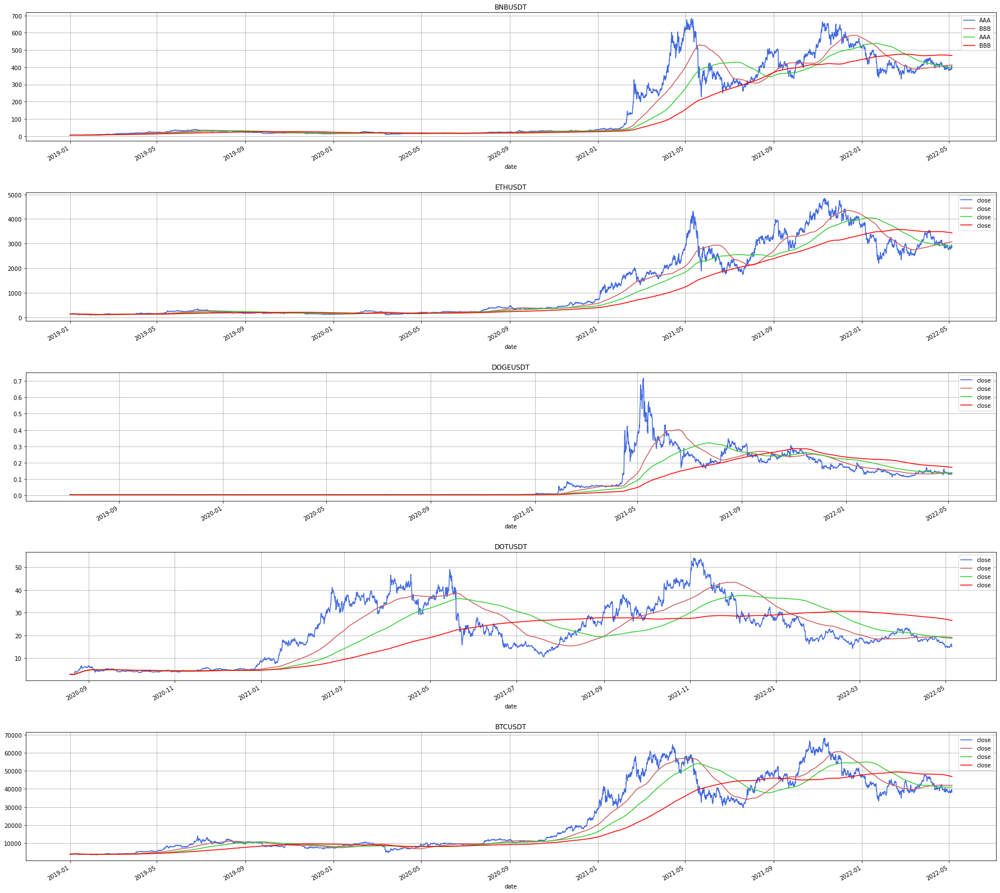

In [27]:
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(30,30));
plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.1, 
                    hspace=0.4)


i=-1
line_width = 1.5

#inicio_ventana = '2021-08-08'
#final_ventana = '2022-04-05'

ax11 = axes[0]
ax12 = axes[1]
ax21 = axes[2]
ax22 = axes[3]
ax32 = axes[4]

ax = [ax11,ax12,ax21,ax22,ax32]

for active in set(df_filtered.active):
    i += 1
    df_all[df_all.active == active]['close'].plot(ax=ax[i], c='royalblue', lw=line_width, grid=True, title=active, legend='diego')
    df_all[df_all.active == active].rolling('50d', min_periods=None, center=False, win_type=None, on=None, axis=0, closed=None).mean()['close'].plot(ax=ax[i], c='indianred', lw=line_width, grid=True, legend='diego')
    df_all[df_all.active == active].rolling('100d', min_periods=None, center=False, win_type=None, on=None, axis=0, closed=None).mean()['close'].plot(ax=ax[i], c='limegreen', lw=line_width, grid=True, legend='diego')
    df_all[df_all.active == active].rolling('200d', min_periods=None, center=False, win_type=None, on=None, axis=0, closed=None).mean()['close'].plot(ax=ax[i], c='red', lw=line_width, grid=True, legend='diego')
    ax11.legend([active, "BBB","AAA", "BBB"]);

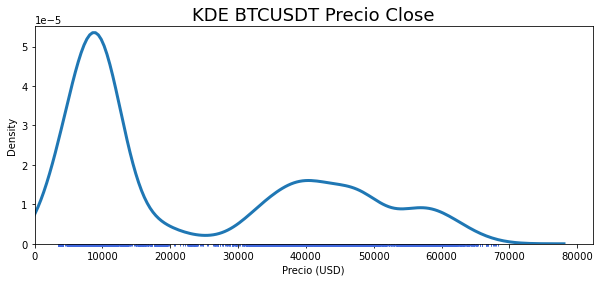

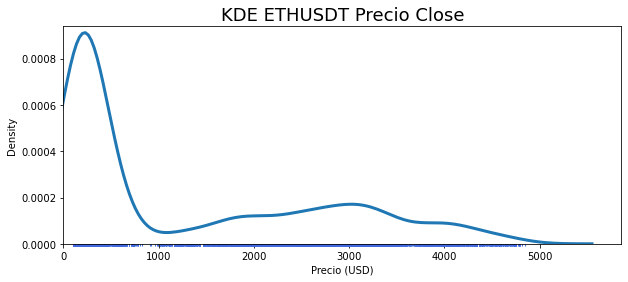

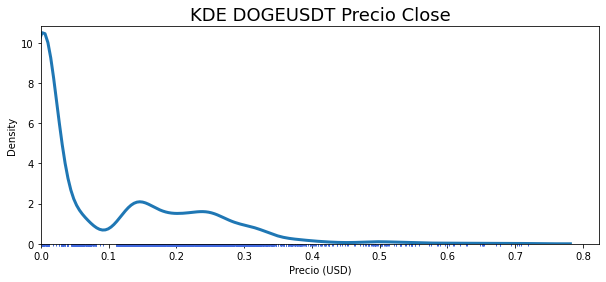

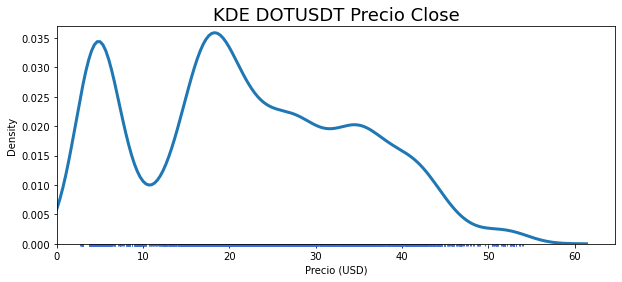

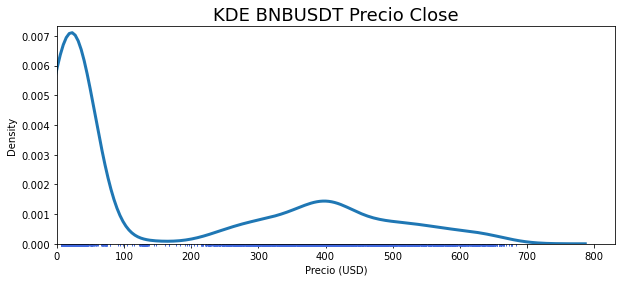

In [35]:
for active in set(df_filtered.active):
    fig,  ax = plt.subplots(figsize=(10, 4))
    p = sns.kdeplot(data=df_filtered[df_filtered.active == active], x='close', linewidth=3, ax=ax)
    r = sns.rugplot(data=df_filtered[df_filtered.active == active], x='close', ax=ax, c='royalblue',
                    height=-.01, clip_on=False)
    p.set(xlim=(0, None))
    p.set_title('KDE {} Precio Close'.format(active), fontsize=18)
    p.set_xlabel('Precio (USD)')

Podemos identificar de los anteriores gráficos que todos los activos, a excepción de DOT, tienen una distribución con sesgo positivo, mientras que DOT tiene una distribución bimodal con una moda cercana a 5 y otra moda cercana a 20.

In [37]:
# Se localizan los datos correspondientes para cada año
# ==============================================================================
years = list(df_filtered.index.year.unique())
df_plot = pd.DataFrame()

for year in years:
    
    year_open  = df_filtered.loc[df_filtered.index.year == year, 'open'][0]
    year_close = df_filtered.loc[df_filtered.index.year == year, 'close'][-1]
    year_low   = df_filtered.loc[df_filtered.index.year == year, 'low'].min()
    year_high  = df_filtered.loc[df_filtered.index.year == year, 'high'].max()
    
    df_plot[year] = pd.Series([year_open, year_close, year_low, year_high]) 
    
df_plot = df_plot.T
df_plot = df_plot.set_axis(['open', 'close', 'low', 'high'], axis=1)

# Se calcula el % de cambio entre el open y el close del año
# ==============================================================================
df_plot['year_change'] = 100*(df_plot['close'] - df_plot['open']) / df_plot['open']
df_plot.head()

,open,close,low,high,year_change
2019,5.9317,7242.85,0.001900,13970.00,122004.118549
2020,13.8461,29194.65,0.001135,29470.00,210751.069976
2021,37.9600,46811.77,0.004751,69000.00,123218.677555
2022,517.8000,NaN,0.106500,48189.84,NaN


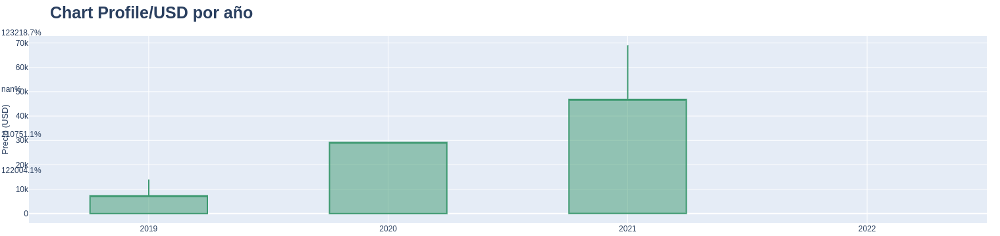

In [38]:
# Se crea una lista de dicts con las anotaciones de % de cambio para el gráfico
# ==============================================================================
annotations_list = []
max_high = df_plot['high'].max()

for year in years:
    
    df_aux = df_plot.loc[df_plot.index == year,]
    loc_x = pd.to_datetime(df_aux.index[0], format='%Y')
    loc_y = df_aux['high'].values[0]/max_high + 0.05
    text = '{:.1f}%'.format(df_aux['year_change'].values[0])
    
    annotation = dict(x=loc_x, y=loc_y, 
                      xref='x', yref='paper',
                      showarrow=False, xanchor='center', 
                      text=text)

    annotations_list.append(annotation)

# Gráfico de velas japonesas anual interactivo con Plotly
# ==============================================================================
candlestick = go.Candlestick(
                    x     = df_plot.index,
                    open  = df_plot.open,
                    close = df_plot.close,
                    low   = df_plot.low,
                    high  = df_plot.high
                    )

fig = go.Figure(data=[candlestick])

fig.update_layout(
    width       = 800,
    height      = 350,
    title       = dict(text='<b>Chart Profile/USD por año</b>', font=dict(size=25)),
    yaxis_title = dict(text='Precio (USD)', font=dict(size=13)),
    margin      = dict(l=0, r=20, t=55, b=20),
    xaxis_rangeslider_visible = False,
    annotations = annotations_list
    )

fig.show()

Al graficar las velas de los activos anteriormente filtrados pero separandolos por año, vemos que hay un aumento sostenido a lo largo de los años del precio de los mismos, arrancando en 2019 con una media rondando los 5k, en 2020 una media de 15k y en 2021 una media de 25k. Sabemos que las criptomonedas  han sido adoptadas por mucha más gente, y podemos ver que el 2020 fue el año en el que más creció con respecto al anterior, probablemente impulsadas por la pandemia.

In [39]:
# Se localizan los datos correspondientes para cada mes
# ==============================================================================
years = list(df_filtered.index.year.unique())
df_plot = pd.DataFrame()

for year in years:
    for mes in range(12):
        
        start_date = pd.to_datetime(f'{year}-{mes+1}-01', format='%Y-%m-%d')
        end_date = (start_date + pd.offsets.MonthBegin())
        mask = (df_filtered.index >= start_date) & (df_filtered.index < end_date)
        
        if not df_filtered.loc[mask, :].empty:
                        
            month_open  = df_filtered.loc[mask, 'open'][0]
            month_close = df_filtered.loc[mask, 'close'][-1]
            month_low   = df_filtered.loc[mask, 'low'].min()
            month_high  = df_filtered.loc[mask, 'high'].max()
            
            serie  = pd.Series([month_open, month_close, month_low, month_high])
            df_aux = pd.DataFrame(serie, columns=[f'{str(mes+1).zfill(2)}-{year}'])
            
            if df_plot.empty:
                df_plot = df_aux.copy()
            else:
                df_plot = pd.concat([df_plot, df_aux], axis=1)

df_plot = df_plot.T
df_plot = df_plot.set_axis(['open', 'close', 'low', 'high'], axis=1)

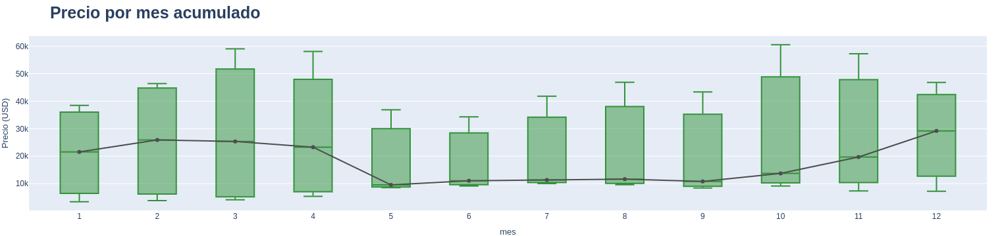

In [40]:
# Gráfico boxplot para estacionalidad anual
# ==============================================================================
import plotly.express as px

palette = {'naranja': '#f7931a',
               'blanco' : '#ffffff',
               'gris'   : '#4d4d4d',
               'azul'   : '#0d579b',
               'verde'  : '#329239'
            }

df_plot['mes'] = pd.to_datetime(df_plot.index, format='%m-%Y').month

# fig 1 boxplot de los meses
fig1 = px.box(df_plot.sort_values('mes'), x='mes', y='close',
              color_discrete_sequence=[palette['verde']])

# fig 2 line con datos de la mediana de cada mes
df_median = pd.DataFrame(df_plot.groupby('mes')['close'].median()).reset_index()
fig2 = px.line(df_median, x='mes', y='close', markers=True,
               color_discrete_sequence=[palette['gris']])

fig = go.Figure(data=fig1.data + fig2.data)

fig.update_layout(
    width       = 650,
    height      = 350,
    title       = dict(text='<b>Precio por mes acumulado</b>', font=dict(size=25)),
    yaxis_title = dict(text='Precio (USD)', font=dict(size=13)),
    xaxis       = dict(tickmode='linear'),
    xaxis_title = dict(text='mes', font=dict(size=13)),
    margin      = dict(l=0, r=20, t=55, b=20)
    )

fig.show()

Del gráfico anterior, podemos concluir que los meses de Marzo, Abril y Octubre son los que más fluctuación de precios generan, mientras que los más estables son los comprendidos entre Mayo y Septiembre.

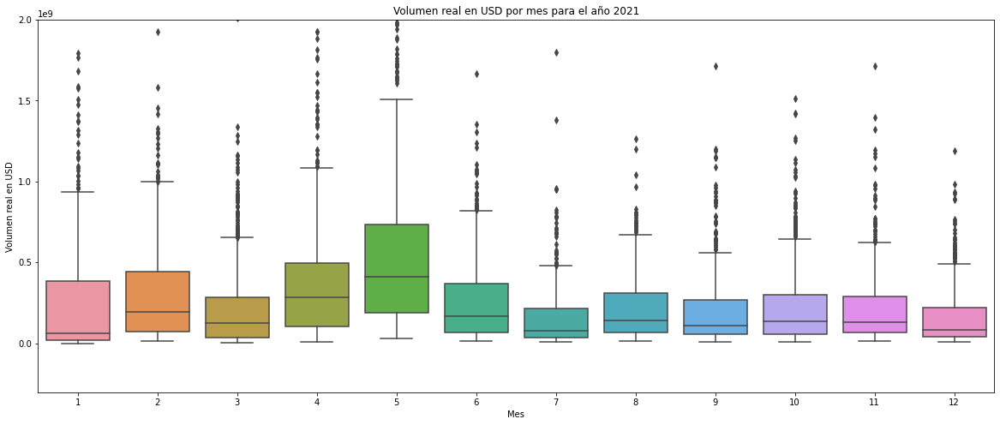

In [47]:
plt.figure(figsize=(20,8))
sns.boxplot(data=df_filtered['2021'], x='month', y='real_volume')
plt.xlabel('Mes')
plt.ylabel('Volumen real en USD')
plt.title('Volumen real en USD por mes para el año 2021')
plt.ylim(top=2e9);

Tomamos el año 2021 porque fue el año con mayor volumen en USD, y podemos apreciar que el mes de Mayo fue el que más USD movió con respecto a los demas. Por otro lado, podemos observar que del gráfico de cajas se desprenden muchos outliers en todos los meses, pero como sabemos que las criptomonedas tiene una volatilidad muy alta, no los consideramos valores atípicos.

Vamos a hacer un gráfico que permita comparar el valor de cierre de las 5 criptomonedas con mayor volumen en USD, para tener una noción de como se comportan los precios entre una y otra.

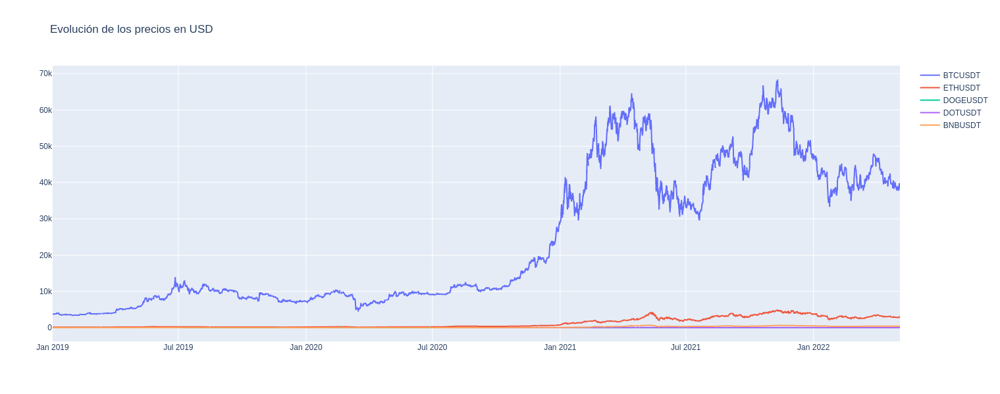

In [67]:
fig = go.Figure()
for active in set(df_filtered.active):
    aux=df_filtered[df_filtered.active == active]['close']
    fig.add_trace(go.Scatter(x=aux.index.astype(dtype=str), 
                            y=aux, name=active))
fig.update_layout(title='Evolución de los precios en USD',
    width=1100,
    height=600,
    )
fig.show()

Podemos ver que el valor de BTC destaca por encima de los demas, y esto es porque es el que mayor valor tiene con respecto a las otras criptomonedas. Necesitamos escalar los valores si vamos a comparar los precios. Primero vamos a escalar los valores con la libreria de sklearn MinMaxScaler y generamos un nuevo DataFrame con los datos escaladas, y veremos como resulta el gráfico.

In [55]:
scaler = MinMaxScaler()
i = 0
for active in set(df_filtered.active):
    df_aux = df_filtered[df_filtered.active == active]
    df_aux['close_scaled'] = scaler.fit_transform(df_aux['close'].values.reshape(-1, 1))
    if i == 0:
        df_final_scaled = df_aux.copy()
        i += 1
    else:
        df_final_scaled = pd.concat([df_final_scaled, df_aux])

df_final_scaled

,open,high,low,close,volume,active,day,month,year,weekday,profit,real_volume,close_scaled
date,,,,,,,,,,,,,
2019-01-01 00:00:00,3690.00,3720.00,3685.78,3703.56,3346.849726,BTCUSDT,1,1,2019,Tuesday,0.367480,1.239526e+07,0.004871
2019-01-01 04:00:00,3703.63,3732.00,3696.14,3713.07,3200.719832,BTCUSDT,1,1,2019,Tuesday,0.254885,1.188450e+07,0.005017
2019-01-01 08:00:00,3713.07,3756.94,3684.21,3698.53,3324.094679,BTCUSDT,1,1,2019,Tuesday,-0.391590,1.229426e+07,0.004794
2019-01-01 12:00:00,3698.28,3701.68,3642.00,3659.41,3089.291395,BTCUSDT,1,1,2019,Tuesday,-1.051029,1.130498e+07,0.004192
2019-01-01 16:00:00,3659.56,3730.01,3659.56,3711.20,4906.805931,BTCUSDT,1,1,2019,Tuesday,1.411099,1.821014e+07,0.004989
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-05-04 20:00:00,402.00,406.20,401.40,403.70,73286.057000,BNBUSDT,4,5,2022,Wednesday,0.422886,2.958558e+07,0.586732
2022-05-05 00:00:00,403.70,404.10,400.00,400.40,53889.912000,BNBUSDT,5,5,2022,Thursday,-0.817439,2.157752e+07,0.581870
2022-05-05 04:00:00,400.40,413.60,398.30,409.00,241069.759000,BNBUSDT,5,5,2022,Thursday,2.147852,9.859753e+07,0.594540


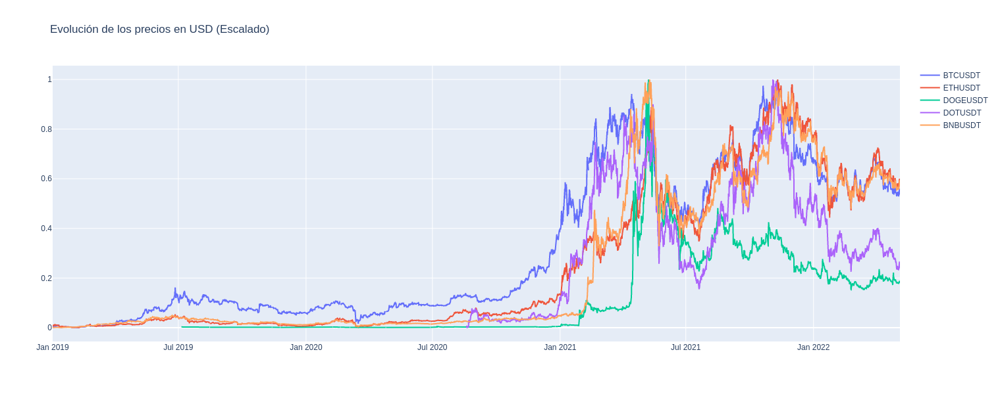

In [66]:
fig = go.Figure()
for active in set(df_final_scaled.active):
    aux=df_final_scaled[df_final_scaled.active == active]['close_scaled']
    fig.add_trace(go.Scatter(x=aux.index.astype(dtype=str), 
                            y=aux, name=active))

fig.update_layout(title='Evolución de los precios en USD (Escalado)',
    width=1100,
    height=600,
    )

fig.show()

Ahora escalamos los datos con otra técnica utilizada en series temporales, que consiste en dividir cada valor por el primero de la serie, y veremos como resulta el gráfico.

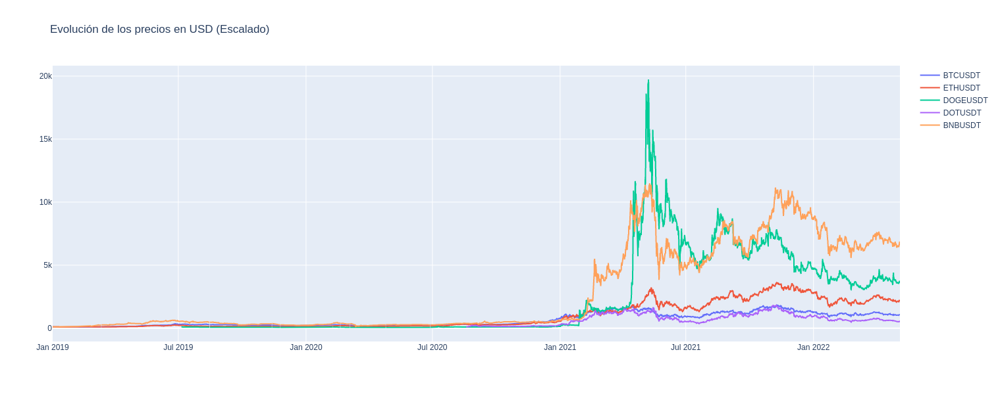

In [68]:
fig = go.Figure()
for active in set(df_filtered.active):
    aux=df_filtered[df_filtered.active == active]['close'].div(df_filtered[df_filtered.active == active]['close'].iloc[0]).mul(100)
    fig.add_trace(go.Scatter(x=aux.index.astype(dtype=str), 
                            y=aux, name=active))

fig.update_layout(title='Evolución de los precios en USD (Escalado)',
    width=1100,
    height=600,
    )
fig.show()

Podemos observar el pico que hace el precio de DOGE en Mayo de 2021, lo cual coincidio con una noticia referida a Elon Musk. Luego a lo largo del tiempo los precios tendieron a estabilizarse, pero se puede apreciar una clara tendencia bajista en todas las criptomonedas desde el pico que tuvimos en 2021.

<AxesSubplot:xlabel='date'>

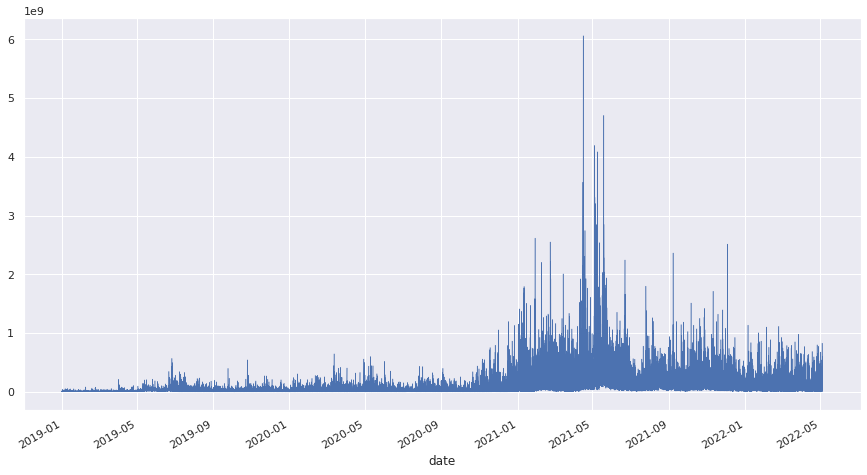

In [69]:
sns.set(rc={'figure.figsize':(15, 8)})
df_filtered['real_volume'].plot(linewidth=0.5)

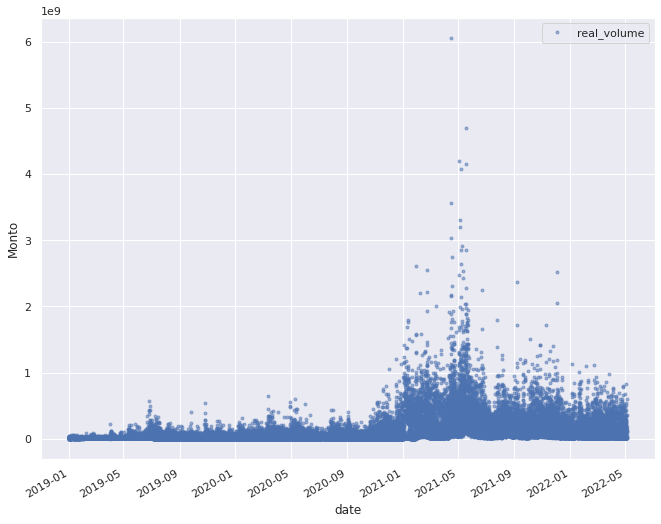

In [70]:
cols_plot = ['real_volume']
axes = df_filtered[cols_plot].plot(marker='.', alpha=0.5, linestyle='None', figsize=(11, 9), subplots=True)
for ax in axes:
    ax.set_ylabel('Monto')

Una vez más apreciamos la volatilidad y el volumen de transacciones que hubo en 2021, año en el que la mayoria de las criptomonedas hicieron máximos absolutos.

Lo que haremos ahora será aplicar el Logaritmo Natural a los precios de cierre de todas las criptomonedas, ya que es una herramienta muy utilizada en gráficos de series temporales, para poder disminuir la volatilidad y poder asi comparar precios entre las distintas criptomonedas.

In [71]:
df_all['close_ln'] = np.log(df_all['close'])

In [72]:
df_all['close_pct'] = df_all['close'].pct_change()

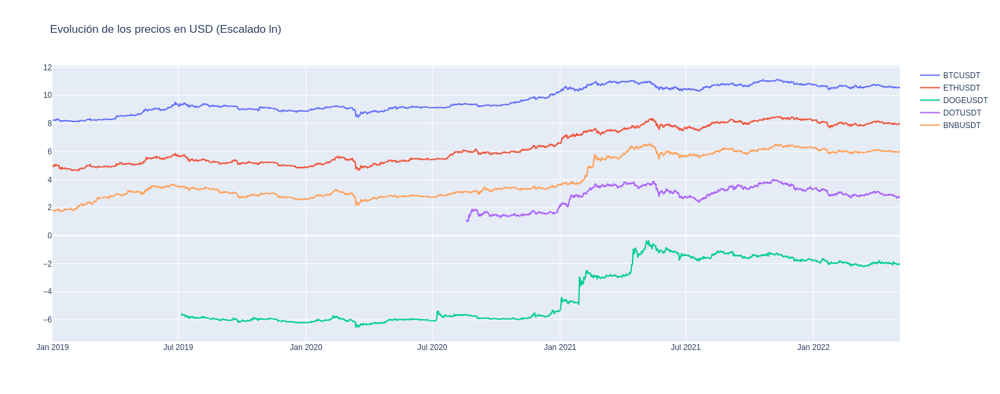

In [74]:
fig = go.Figure()
for active in set(df_filtered.active):
    aux=df_all[df_all.active == active]['close_ln']
    fig.add_trace(go.Scatter(x=aux.index.astype(dtype=str), 
                            y=aux, name=active))

fig.update_layout(title='Evolución de los precios en USD (Escalado ln)',
    width=1100,
    height=600,
    )
fig.show()

Al escalar los precios con el logaritmo natural, podemos generar una nueva escala entre las distintas monedas y podemos apreciar como BTC queda por encima del resto, seguida por ETH y BNB.

In [75]:
df_filtered['close_ln'] = np.log(df_filtered['close'])
df_filtered['close_pct'] = df_filtered['close'].pct_change()

In [76]:
df_filt_descr_cl_ln=df_filtered.groupby(['active']).close_ln.describe()
df_filt_descr_cl_ln

,count,mean,std,min,25%,50%,75%,max
active,,,,,,,,
BNBUSDT,7290.0,4.101946,1.498367,1.693062,2.873505,3.369693,5.910458,6.528280
BTCUSDT,7290.0,9.712809,0.891057,8.127688,9.053968,9.343118,10.634249,11.132875
DOGEUSDT,6183.0,-4.050267,2.097221,-6.561262,-5.962022,-5.644589,-1.770487,-0.330826
DOTUSDT,3736.0,2.851535,0.771518,0.996616,2.566198,3.026745,3.464851,3.989910
ETHUSDT,7290.0,6.393700,1.290023,4.619763,5.214637,5.920425,7.839993,8.485752


In [77]:
df_filt_descr_cl = df_filtered.groupby(['active']).close.describe()
df_filt_descr_cl

,count,mean,std,min,25%,50%,75%,max
active,,,,,,,,
BNBUSDT,7290.0,167.640698,202.631696,5.436100,17.698950,29.069600,368.87500,684.22000
BTCUSDT,7290.0,23909.639897,19072.784492,3386.960000,8552.405000,11419.965000,41533.20500,68382.69000
DOGEUSDT,6183.0,0.090440,0.120760,0.001414,0.002575,0.003537,0.17025,0.71833
DOTUSDT,3736.0,21.959403,12.658140,2.709100,13.016250,20.630000,31.97170,54.05000
ETHUSDT,7290.0,1280.010417,1392.286357,101.470000,183.945000,372.570000,2540.18750,4845.24000


Agregamos el desvío estándar móvil de 7 días a cada gráfico para obtener otra visualización y así comparar la volatilidad entre los distintos activos.

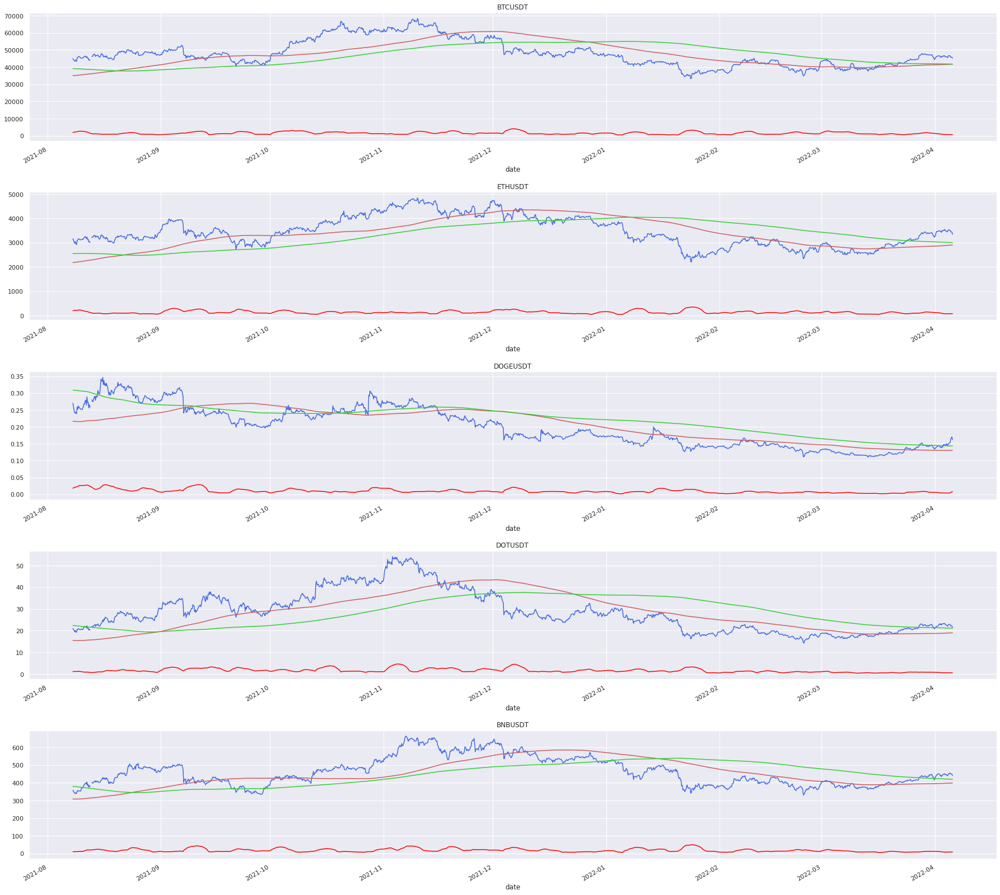

In [78]:
fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(30,30));
plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9, 
                    top=0.9, 
                    wspace=0.1, 
                    hspace=0.4)


i=-1
line_width = 1.5

inicio_ventana = '2021-08-08'
final_ventana = '2022-04-05'

ax11 = axes[0]
ax12 = axes[1]
ax21 = axes[2]
ax22 = axes[3]
ax32 = axes[4]

ax = [ax11,ax12,ax21,ax22,ax32]

for active in set(df_filtered.active):
    i += 1
    df_all[df_all.active == active][inicio_ventana : final_ventana]['close'].plot(ax=ax[i], c='royalblue', lw=line_width, grid=True, title=active)
    df_all[df_all.active == active].rolling('50d', min_periods=None, center=False, win_type=None, on=None, axis=0, closed=None).mean()[inicio_ventana : final_ventana]['close'].plot(ax=ax[i], c='indianred', lw=line_width, grid=True)
    df_all[df_all.active == active].rolling('100d', min_periods=None, center=False, win_type=None, on=None, axis=0, closed=None).mean()[inicio_ventana : final_ventana]['close'].plot(ax=ax[i], c='limegreen', lw=line_width, grid=True)
    #Agregamos la desviacion estandar movil
    df_all[df_all.active == active].rolling('7d', min_periods=None, center=False, win_type=None, on=None, axis=0, closed=None).std()[inicio_ventana : final_ventana]['close'].plot(ax=ax[i], c='red', lw=line_width, grid=True)

